In [1]:
import matplotlib.animation as animation
import mplfinance as mpf
import yfinance as yf

from IPython.display import HTML


from backtest import *
from technical_analysis import *
from utils import *

In [2]:
ticker = 'AAPL'
start = '2021-10-28'
period = '1d'
interval = '5m'

df = yf.download(tickers=ticker, start=start, period=period, interval=interval)
df.columns = df.columns.str.lower()
df

[*********************100%***********************]  1 of 1 completed


,open,high,low,close,adj close,volume
Datetime,,,,,,
2021-10-27 12:00:00-04:00,149.180099,149.360001,149.149994,149.210007,149.210007,0
2021-10-27 12:05:00-04:00,149.212997,149.289993,149.169998,149.250000,149.250000,372642
2021-10-27 12:10:00-04:00,149.255005,149.360001,149.250000,149.345001,149.345001,369339
2021-10-27 12:15:00-04:00,149.345001,149.410004,149.222107,149.404999,149.404999,466153
2021-10-27 12:20:00-04:00,149.399994,149.419998,149.320007,149.369995,149.369995,275320
...,...,...,...,...,...,...
2021-10-29 15:35:00-04:00,149.604996,149.750000,149.449997,149.505005,149.505005,1398256
2021-10-29 15:40:00-04:00,149.505005,149.610001,149.449997,149.500000,149.500000,1178162
2021-10-29 15:45:00-04:00,149.494995,149.595001,149.380005,149.395004,149.395004,1306782


In [31]:
def cal_macd(df, short=12, long=26, signal=9, *args, **kwargs):
    '''
    Moving Average Convergence/Divergence Oscillator
    '''
    macd_params = kwargs.get('macd_params', {})
    short = macd_params.get('short', short)
    long = macd_params.get('long', long)
    signal = macd_params.get('signal', signal)
    
    #df = df.copy()
    dif = cal_moving_func(df.close, short, method='ema') - \
          cal_moving_func(df.close, long, method='ema')

    dem = cal_moving_func(dif, signal, method='ema') # macd
    osc = dif - dem # 柱狀圖
    df['dif'] = dif
    df['dem'] = dem
    df['osc'] = osc
    return df

df = (
    df.pipe(cal_sma, 'volume', [5, 10, 20], suffix='_v')
    .pipe(cal_macd)
    .pipe(cal_sma, 'close', [5, 10, 20])
)

In [32]:
df

,open,high,low,close,adj close,volume,dem,osc,dif,ma5_v,ma10_v,ma20_v,ma5,ma10,ma20
Datetime,,,,,,,,,,,,,,,
2021-10-27 12:00:00-04:00,149.180099,149.360001,149.149994,149.210007,149.210007,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-27 12:05:00-04:00,149.212997,149.289993,149.169998,149.250000,149.250000,372642,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-27 12:10:00-04:00,149.255005,149.360001,149.250000,149.345001,149.345001,369339,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-27 12:15:00-04:00,149.345001,149.410004,149.222107,149.404999,149.404999,466153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-27 12:20:00-04:00,149.399994,149.419998,149.320007,149.369995,149.369995,275320,NaN,NaN,NaN,296690.8,NaN,NaN,149.316000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-29 15:35:00-04:00,149.604996,149.750000,149.449997,149.505005,149.505005,1398256,0.093311,0.043695,0.137005,1237907.0,912641.5,822795.85,149.442001,149.280000,149.164145
2021-10-29 15:40:00-04:00,149.505005,149.610001,149.449997,149.500000,149.500000,1178162,0.103198,0.039549,0.142747,1290968.6,985573.9,844748.10,149.485001,149.319000,149.196645
2021-10-29 15:45:00-04:00,149.494995,149.595001,149.380005,149.395004,149.395004,1306782,0.110007,0.027236,0.137242,1282113.8,1076529.6,846559.90,149.500000,149.343501,149.207145


In [9]:
color = mpf.make_marketcolors(up='#FF0000', down='#00FF00', inherit=True)
style = mpf.make_mpf_style(base_mpf_style='nightclouds', marketcolors=color)
kwargs = dict(
    type='candle',
    style=style,
)

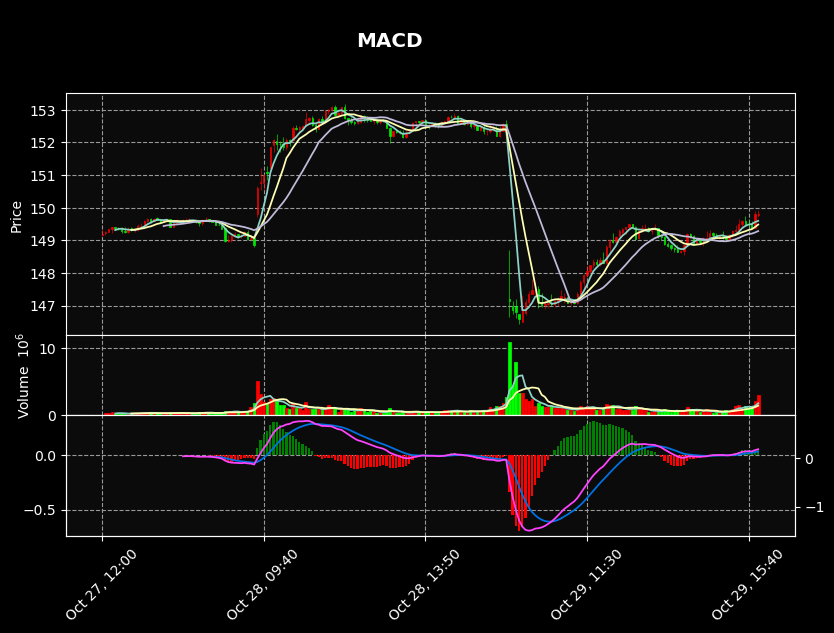

In [46]:
bar_color = np.sign(df['osc']).map({1: 'g', -1: 'r', np.nan:'black'}).tolist()
apds = [
    mpf.make_addplot(df[['ma5', 'ma10', 'ma20']]),
    mpf.make_addplot((df[['ma5_v', 'ma10_v']]), panel=1),
    
    mpf.make_addplot(df['osc'],
                     type='bar',
                     width=0.7,
                     panel=2,
                     color=bar_color,
                     alpha=1,
                     secondary_y=False),
    mpf.make_addplot(df['dem'], panel=2, color='#0072E3', secondary_y=True),
    mpf.make_addplot(df['dif'], panel=2, color='#FF44FF', secondary_y=True),
]

mpf.plot(df,
         addplot=apds,
         figscale=1.1,
         figratio=(8, 5),
         title='\nMACD',
         volume=True,
         volume_panel=1,
         panel_ratios=(6, 2, 3),
         **kwargs)

可以畫，但要畫得東西一多，速度就跟不上了

# animation

In [61]:
%matplotlib

Using matplotlib backend: Qt5Agg


In [72]:
data_interval = 40
bar_color = np.sign(df['osc']).map({1: 'g', -1: 'r', np.nan:'black'}).tolist()

apds = [
    mpf.make_addplot(df[['ma5', 'ma10', 'ma20']].iloc[:data_interval]),
    mpf.make_addplot((df[['ma5_v', 'ma10_v']]).iloc[:data_interval], panel=1),
    
    mpf.make_addplot(df['osc'].iloc[:data_interval],
                     type='bar',
                     width=0.7,
                     panel=2,
                     color=bar_color[:data_interval],
                     alpha=1,
                     secondary_y=False),
    mpf.make_addplot(df['dem'].iloc[:data_interval], panel=2, color='#0072E3', secondary_y=True),
    mpf.make_addplot(df['dif'].iloc[:data_interval], panel=2, color='#FF44FF', secondary_y=True),
]

fig, axes = mpf.plot(df.iloc[:data_interval],
                     addplot=apds,
                     figscale=1.1,
                     figratio=(8, 5),
                     title='\nMACD',
                     returnfig=True, 
                     volume=True,
                     volume_panel=1,
                     panel_ratios=(6, 2, 3),
                     **kwargs)


def animate(i):
    global axes
    for ax in axes:
        ax.clear()
        
    apds = [
        mpf.make_addplot(df[['ma5', 'ma10', 'ma20']].iloc[i:i+data_interval], ax=axes[0]),
        mpf.make_addplot((df[['ma5_v', 'ma10_v']].iloc[i:i+data_interval]), panel=1, ax=axes[2]),

        mpf.make_addplot(df['osc'].iloc[i:i+data_interval],
                         type='bar',
                         width=0.7,
                         panel=2,
                         color=bar_color[i:i+data_interval],
                         alpha=1,
                         secondary_y=False, 
                         ax=axes[4]),
        mpf.make_addplot(df['dem'].iloc[i:i+data_interval], panel=2, color='#0072E3', secondary_y=True, ax=axes[4]),
        mpf.make_addplot(df['dif'].iloc[i:i+data_interval], panel=2, color='#FF44FF', secondary_y=True, ax=axes[4]),
    ]

    _fig = mpf.plot(df.iloc[i:i+data_interval],
                     addplot=apds,
                     figscale=1.1,
                     figratio=(8, 5),
                     #title='\nMACD', # 不用加
                     returnfig=True, 
                     ax=axes[0],
                     volume=axes[2],
                     volume_panel=1,
                     panel_ratios=(6, 2, 3),
                     **kwargs)
    
    return _fig,

ani = animation.FuncAnimation(fig, animate, interval=100)

In [69]:
HTML(ani.to_jshtml())